# DSI Capstone: Shopee Product Matching

## Problem Statement

Retail companies like Shopee use product matching to assure customers that their rates are competitive to that of other retailers for the same products. They seek to identify identical products across different product images, titles and descriptions.

Given product titles and images, this project predicts which products are the same. 

Group sizes for products range from 2 to 51. Predictions will be made row-wise for each product, and will include the product itself.

For example, if the set of all products is [A, B, C, D, E], and we believe A, B, C are the same and D & E are the same, we will predict as such:

|Product|Predictions|
|-------|-------|
|A|A, B, C|
|B|B, A, C|
|C|C, A, B|
|D|D,E|
|E|E,D|

Predictions will be scored using the F1 Score / Dice Metric: $\frac{2\times(A \bigcap B)}{|A| + |B|}$, where A is the set of our predictions and B is the set of actual matches.

For example, if the actual matches for product A is only A & B, our score will be: $\frac{2\times([A,B] \bigcap [A,B,C])}{|[A,B]| + |[A,B,C]|}$ = $\frac{2\times 2}{5} = 0.8$

The F1 Score for each row will be averaged across all rows to give the final score:

|Product|Predictions|Actual Matches|F1 Score|
|-------|-----------|--------------|--------|
|A|A, B, C|A, B|0.8|
|B|B, A, C|B, A|0.8|
|C|C, A, B|C, D, E|0.33|
|D|D,E|D, C, E|0.8|
|E|E,D|E, C, D|0.8|
| |   |Average Score|0.71|

The train dataset consists of 34,250 product images, image phash and titles along with their label groups. The hidden test dataset on Kaggle will consist of 70,000+ product images, image phash and titles.

## Executive Summary

Image feature embeddings of size 1,792 were generated using default and retrained EfficientNetB4.

Text feature embeddings of size 25,053 were generated using TF-IDF vectorizer on processed title tokens.

Text feature embeddings of size 768 were generated using Google Language-agnostic BERT Sentence Embedding.

sklearn/cuML NearestNeighbors algorithm was applied to these embeddings to generate 51 nearest neighbours for each product. Grid search of various distance thresholds was performed to find the optimum threshold to predict product matches.

By taking the set union of various models, recall improved as the predictions from different models complemented each other.

By setting a soft distance threshold, precision improved as fewer excessive predictions were made.

The final model using an ensemble of image and text embeddings achieved a train score of 0.783 and Kaggle test score of 0.728.

## Data Dictionary

The train data comprises a .csv file with posting_id, image, image_phash, title and label_group.

The test data will have posting_id, image, image_phash and title.

|Column|Type|Description|
|-------|-----------|--------------|
|posting_id|string|Unique identification number for each product|
|image|string|Name of image file stored in image folder|
|image_phash|string|Perceptual hash of image|
|title|string|Product title|
|label_group|int|Identification number for product groups <br /> Products are the same if they have the same label group <br /> Not provided for test data|

## Imports and Data Checks

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import os
from PIL import Image

In [2]:
# Install Google translator
!pip install google_trans_new
from google_trans_new import google_translator

In [3]:
# Read csv files
train = pd.read_csv('../datasets/train.csv')
test = pd.read_csv('../datasets/test.csv')

In [4]:
# Set image directories
train_dir = '../datasets/train_images/'
test_dir = '../datasets/test_images/'

In [5]:
# Check training data size
train.shape

(34250, 5)

In [6]:
# Check train.csv first few rows
train.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


In [7]:
# Check if images in train folder are same as images in train.csv
set(train['image']) == set(os.listdir(train_dir))

True

In [8]:
# Check if images in test folder are same as images in test.csv
set(test['image']) == set(os.listdir(test_dir))

True

In [9]:
# Check image pixel sizes for train set
train_image_sizes = []
for image in train['image']:
    width, height = Image.open(train_dir + image).size
    train_image_sizes.append((width, height))

In [10]:
# Check image size distribution
pd.Series(train_image_sizes).value_counts()

(640, 640)      12259
(1024, 1024)     6384
(800, 800)       3916
(700, 700)       2935
(1000, 1000)     1540
                ...  
(296, 296)          1
(640, 630)          1
(879, 879)          1
(640, 461)          1
(432, 432)          1
Length: 824, dtype: int64

In [11]:
# Check all unique image sizes
set(train_image_sizes)

{(100, 100),
 (110, 110),
 (130, 130),
 (133, 133),
 (155, 155),
 (176, 176),
 (187, 187),
 (194, 194),
 (195, 195),
 (200, 200),
 (207, 207),
 (213, 213),
 (220, 220),
 (224, 224),
 (225, 225),
 (227, 227),
 (230, 230),
 (231, 231),
 (233, 233),
 (234, 234),
 (236, 236),
 (239, 239),
 (240, 240),
 (241, 241),
 (242, 242),
 (243, 243),
 (245, 245),
 (246, 246),
 (252, 252),
 (253, 253),
 (254, 254),
 (259, 259),
 (260, 260),
 (264, 264),
 (265, 265),
 (267, 267),
 (269, 269),
 (273, 273),
 (274, 274),
 (275, 275),
 (279, 279),
 (280, 280),
 (283, 283),
 (284, 284),
 (286, 286),
 (288, 288),
 (290, 290),
 (291, 291),
 (295, 295),
 (296, 296),
 (297, 297),
 (298, 298),
 (300, 300),
 (301, 301),
 (302, 302),
 (303, 303),
 (305, 305),
 (306, 306),
 (307, 307),
 (308, 308),
 (309, 475),
 (310, 310),
 (311, 311),
 (311, 640),
 (312, 312),
 (313, 313),
 (314, 314),
 (315, 315),
 (316, 316),
 (318, 318),
 (319, 319),
 (320, 320),
 (322, 322),
 (324, 324),
 (325, 325),
 (326, 326),
 (328, 328),

In [12]:
# Check image pixel sizes for dummy test set
test_image_sizes = []
for image in test['image']:
    width, height = Image.open(test_dir + image).size
    test_image_sizes.append((width, height))

In [13]:
pd.Series(test_image_sizes).value_counts()

(640, 640)      2
(1000, 1000)    1
dtype: int64

In [14]:
# Check how many label groups in train data
len(train.groupby(by='label_group'))

11014

In [15]:
# Check how many unique image phash in train data
len(train.groupby(by='image_phash'))

28735

## Label Groups and Image Phash

In [16]:
# Create dictionary of label groups (key) and posting IDs (values)
label_dict = train.groupby('label_group')['posting_id'].unique().to_dict()

# Create column of matching products
train['matches'] = train['label_group'].map(label_dict)

In [17]:
# Create dictionary of image phash (key) and posting IDs (values)
label_dict = train.groupby('image_phash')['posting_id'].unique().to_dict()

# Create column of image duplicates
train['image_duplicates'] = train['image_phash'].map(label_dict)

In [18]:
train.head()

,posting_id,image,image_phash,title,label_group,matches,image_duplicates
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,"[train_129225211, train_2278313361]",[train_129225211]
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,"[train_3386243561, train_3423213080]",[train_3386243561]
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,"[train_2288590299, train_3803689425]",[train_2288590299]
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,"[train_2406599165, train_3342059966]",[train_2406599165]
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,"[train_3369186413, train_921438619]",[train_3369186413]


In [19]:
# Check top label groups
pd.Series(train.groupby(by='label_group').size()).sort_values(ascending=False).head(10)

label_group
1163569239    51
159351600     51
994676122     51
3113678103    51
3627744656    51
1141798720    51
562358068     51
3206118280    49
1733221456    46
1166650192    46
dtype: int64

In [20]:
# Check distribution of  label group sizes
pd.Series(train.groupby(by='label_group').size()).sort_values(ascending=False).value_counts(normalize=True).head(10)

2     0.633648
3     0.161522
4     0.078264
5     0.042491
6     0.025604
7     0.013982
8     0.010714
9     0.008262
10    0.004358
12    0.003541
dtype: float64

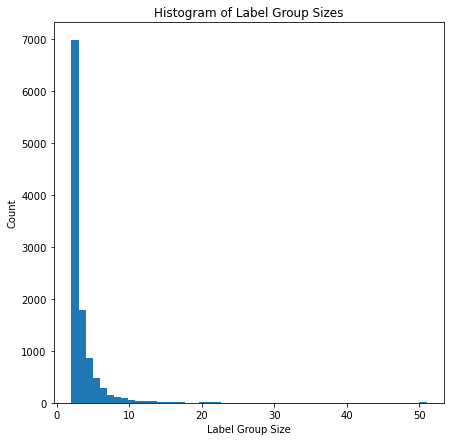

In [21]:
# Check histogram of label group sizes
plt.figure(figsize=(7,7))
plt.hist(pd.Series(train.groupby(by='label_group').size()), bins = 50)
plt.xlabel('Label Group Size')
plt.ylabel('Count')
plt.title('Histogram of Label Group Sizes');

In [22]:
# Check label group 1163569239 with 51 matches
train.loc[train['label_group'] == 1163569239]

,posting_id,image,image_phash,title,label_group,matches,image_duplicates
1088,train_1671347582,089060edc61ec626e6b4943cf18dd651.jpg,e38c9933a571a627,SCARLETT SERUM - BEBAS PILIH,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_1671347582]
1365,train_1175819799,0ad5228fee2f95f68253719c32fc4f5b.jpg,bf93c06c67901763,SCARLETT WHITENING ACNE SERUM,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_1175819799]
1889,train_1525859862,0e9286fbfd1a0c00287c2c93a4738b9a.jpg,f956c679d5d410d0,SERUM SCARLETT ACNE & BRIGHTLY- SERUM WAJAH SC...,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_1525859862]
1932,train_1261404451,0ee29d56042b2ff25d171b0f090463a8.jpg,b62c2bc37b5e1486,Scarlett Whitening Brightly Ever After Serum,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_1261404451]
2223,train_1865413913,11007ac5a612addbb5df96445e438b14.jpg,bbcb16f01ae0039f,SCARLETT serum wajah NEW,1163569239,"[train_1671347582, train_1175819799, train_152...","[train_1865413913, train_3789517483, train_296..."
2822,train_943427380,158ac22bf48f9c2edfde81e2502af076.jpg,f9565739d5c450c4,SERUM SCARLETT ACNE & BRIGHTLY- FACE SERUM ORI...,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_943427380]
4111,train_3789517483,1f54f4cee1e5c094b00e0e423971f283.jpg,bbcb16f01ae0039f,SCARLETT Whitening Brightly Ever After Serum /...,1163569239,"[train_1671347582, train_1175819799, train_152...","[train_1865413913, train_3789517483, train_296..."
5343,train_3171223531,286db00383814bfdb2191d7a9dee6d22.jpg,e6d1992eea898966,SCARLETT WHITENING BRIGHTLY EVER AFTER SERUM,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_3171223531]
7558,train_623546295,3907af8ee31d85d32ddaf03a067099ad.jpg,e79c93632472c66c,SCARLETT ACNE SERUM & BRIGHTLY EVER AFTER SERUM,1163569239,"[train_1671347582, train_1175819799, train_152...","[train_623546295, train_612230357, train_23053..."
7576,train_3598710032,3922820f64ae0759bdd2a3e44e5466da.jpg,e59c9b63a472c62c,Scarlett Serum,1163569239,"[train_1671347582, train_1175819799, train_152...",[train_3598710032]


In [23]:
# Check label group 1163569239 phash
train.loc[train['label_group'] == 1163569239]['image_phash'].value_counts()

bbcb16f01ae0039f    9
e79c9b632452c66c    5
e79c93632472c66c    4
b699d9663838cb32    2
b3cdcc328ccd3326    2
e6d1992eea898966    1
bf93c06c67901763    1
e79c9363245ac66c    1
bbcb34fc1ae0038d    1
e79c9b63a478c264    1
bbcb16f41ae0039d    1
f9565679d5c450c4    1
eb2fd03867191e86    1
b620e8d99575d25a    1
a9c67469c79698c5    1
ef9c93632452c66c    1
e38c9933a571a627    1
da988c2d3b4e8f61    1
f9565739d5c450c4    1
b62c2bc37b5e1486    1
ec9e1a641be625d1    1
d88f26105b79fc89    1
a9cf94709a64839f    1
f3067c4b91b08ee3    1
e59c9b63a472c62c    1
b299cc669999ce26    1
f956c679d5d410d0    1
b289cd669999ce26    1
f567e8888a1d3535    1
b9c6c639c6c73838    1
e996966929926c6d    1
ee0f7868984b0fd2    1
bf3dd6e0c861614c    1
f25ac8728d8da5a5    1
Name: image_phash, dtype: int64

Label group 1163569239, comprising 51 products, has varying titles and image phash. 

The titles are in English and Indonesian, and subsets of the images are duplicates (as identified by the image phash).

In [24]:
# Check top image phash
pd.Series(train.groupby(by='image_phash').size()).sort_values(ascending=False).head(10)

image_phash
fad28daa2ad05595    26
d0c0ea37bd9acce0    20
be12e12f9ec1e198    17
e992966d4ba49761    16
f6d98134b904b56b    16
ba96cc48cc63c56b    14
def6e14b4a398885    13
84563f696135c79a    13
ce2fa4d3959a51b0    12
bb13e24edd48d02e    12
dtype: int64

In [25]:
# Check image phash distribution
pd.Series(train.groupby(by='image_phash').size()).sort_values(ascending=False).value_counts(normalize=True).head(10)

1     0.887628
2     0.075274
3     0.020532
4     0.007447
5     0.003619
6     0.001810
7     0.001148
8     0.000974
9     0.000592
10    0.000313
dtype: float64

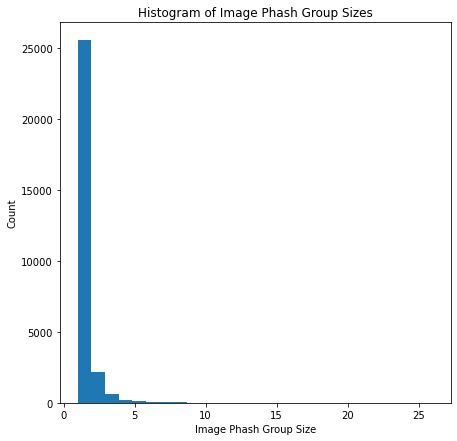

In [26]:
# Check histogram of image phash sizes
plt.figure(figsize=(7,7))
plt.hist(pd.Series(train.groupby(by='image_phash').size()), bins = 26)
plt.xlabel('Image Phash Group Size')
plt.ylabel('Count')
plt.title('Histogram of Image Phash Group Sizes');

Most image phash (88.7%) are unique, and it may not be suitable to identify similar images.

## Images

### Label Groups

In [27]:
# Create function to show images from dataframe and posting_id, grouped with label_group or image_phash
def show_images(df, posting_id, image_phash=False, columns=3, width=30, height=10):
    
    # If we are checking for duplicate images
    if image_phash:
        group = df.loc[df['posting_id'] == posting_id]['image_duplicates'].values[0]

    # If we are checking for same label groups
    else:
        group = df.loc[df['posting_id'] == posting_id]['matches'].values[0]
     
    height = max(height, int(len(group)/columns) * height)
    plt.figure(figsize=(width, height))
    
    for i in range(len(group)):
        plt.subplot(len(group) // columns + 1, columns, i + 1)
        im = Image.open(train_dir + df.loc[df['posting_id'] == group[i]]['image'].values[0])
        plt.imshow(im)
        plt.title(df.loc[df['posting_id'] == group[i]]['title'].values[0])

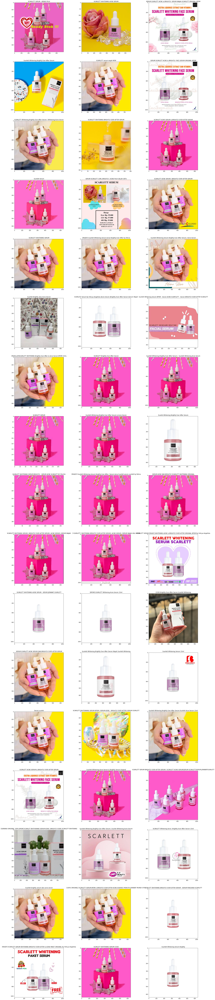

In [28]:
# Show item train_1671347582 and its 50 matches from label group 1163569239
show_images(train, 'train_1671347582')

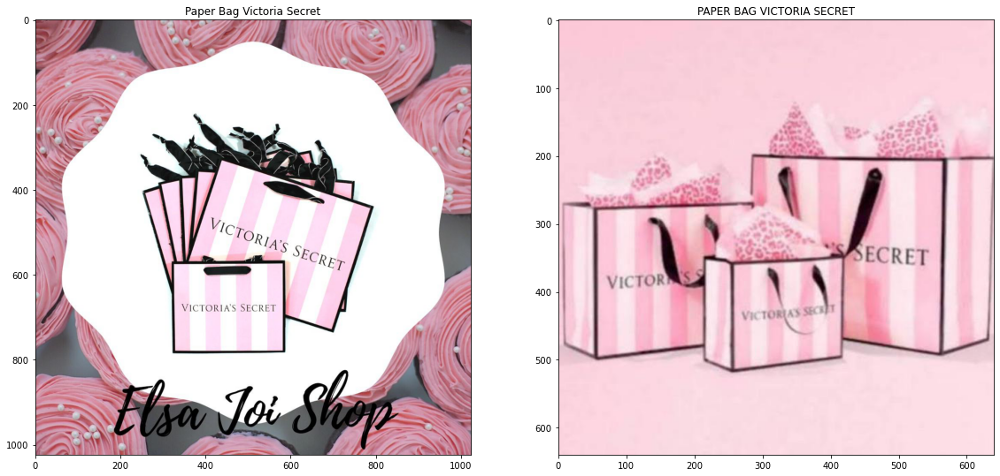

In [29]:
# Show item train_129225211 and its single match from label group 249114794
show_images(train, 'train_129225211')

### Image Phash

In [30]:
# Check image phash fad28daa2ad05595, which has 26 copies
train.loc[train['image_phash'] == 'fad28daa2ad05595']

,posting_id,image,image_phash,title,label_group,matches,image_duplicates
579,train_1015625393,04a00bccb7f1560e755f5f1def73db59.jpg,fad28daa2ad05595,Sugar Baby Organic Healthy Cot Sheet Perlak Bayi,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
1978,train_1942146514,0f459b1e8aa89ee9e79b2ec95440e9c3.jpg,fad28daa2ad05595,Perlak Karet Organic Bayi Sugar Baby uk 90x60 ...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
1979,train_1720530417,0f459b1e8aa89ee9e79b2ec95440e9c3.jpg,fad28daa2ad05595,Perlak Karet Organik Bayi Sugar Baby uk 90x60 ...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
3916,train_1062957964,1dbf735adb93d54e6340af02f9b5472e.jpg,fad28daa2ad05595,MURAH!! SUGAR BABY Perlak (Perlak Karet Waterp...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
3917,train_4124267548,1dbf735adb93d54e6340af02f9b5472e.jpg,fad28daa2ad05595,Sugar Baby Organic Healthy Cot Sheet - Perlak ...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
5919,train_4270145275,2cd540e8c1810d1d1aaf3d73b8116cdc.jpg,fad28daa2ad05595,Perlak Bayi Sugar Baby (Alas Ompol Waterproof ...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
8993,train_989190235,43af52158ed9acd8274a7d6d6c109dfc.jpg,fad28daa2ad05595,Perlak Waterproof Bayi SUGAR BABY 90 x 60 cm O...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
10768,train_3574291998,50ef370271e8c7e00eaaf018c9cd93dd.jpg,fad28daa2ad05595,Sugar Baby Pink Kitten Organic Healthy Cot She...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
12248,train_1943986671,5c1e0f695fb5ab7b0d83de0fef4bfdaf.jpg,fad28daa2ad05595,Perlak Bayi organik SUGAR BABY / Perlak karet ...,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."
17760,train_3141138577,8591ed8b5bc268e386a66206bb233b2f.jpg,fad28daa2ad05595,Perlak Sugar Baby 90x60cm,997220911,"[train_1015625393, train_1942146514, train_172...","[train_1015625393, train_1942146514, train_172..."


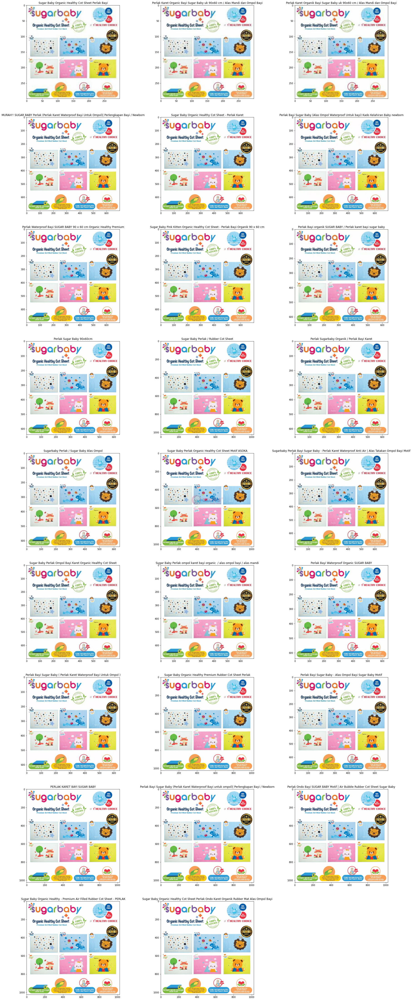

In [31]:
# Show copies of item train_1015625393 with image phash fad28daa2ad05595
show_images(train, 'train_1015625393', image_phash=True)

In [32]:
# Check label groups of image phash fad28daa2ad05595
train.loc[train['image_phash'] == 'fad28daa2ad05595']['label_group'].value_counts()

997220911    26
Name: label_group, dtype: int64

All of the 26 products with the same image phash fad28daa2ad05595 above belong to the same label group 997220911.

In [33]:
# Check image phash d0c0ea37bd9acce0, which has 20 copies
train.loc[train['image_phash'] == 'd0c0ea37bd9acce0']

,posting_id,image,image_phash,title,label_group,matches,image_duplicates
1651,train_3068759534,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,BUBBLE PACK UNTUK PACKING TAMBAHAN 1BUBBLE UNT...,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1652,train_1049463374,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,BUBBLE WARP,2403374241,"[train_3284960524, train_1049463374, train_422...","[train_3068759534, train_1049463374, train_242..."
1653,train_2420615645,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,BUBBLE WRAP - EXTRA PACKING UNTUK BARANG ANDA,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1654,train_1236710293,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,Bubble Warp Pengaman Pengiriman,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1655,train_443869273,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,Bubble Wrap,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1656,train_1381575164,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,Bubble Wrap untuk ekstra packaging,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1657,train_2085280992,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,Buble Wrap,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1658,train_4226152332,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,EXTRA BUBBLE WRAP UNTUK PACKING,2403374241,"[train_3284960524, train_1049463374, train_422...","[train_3068759534, train_1049463374, train_242..."
1659,train_1437764574,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,Extra Bubble Wrap,4198148727,"[train_3068759534, train_2420615645, train_123...","[train_3068759534, train_1049463374, train_242..."
1660,train_3993385953,0cca4afba97e106abd0843ce72881ca4.jpg,d0c0ea37bd9acce0,Extra Bubble Wrap Pengaman Packingan,2403374241,"[train_3284960524, train_1049463374, train_422...","[train_3068759534, train_1049463374, train_242..."


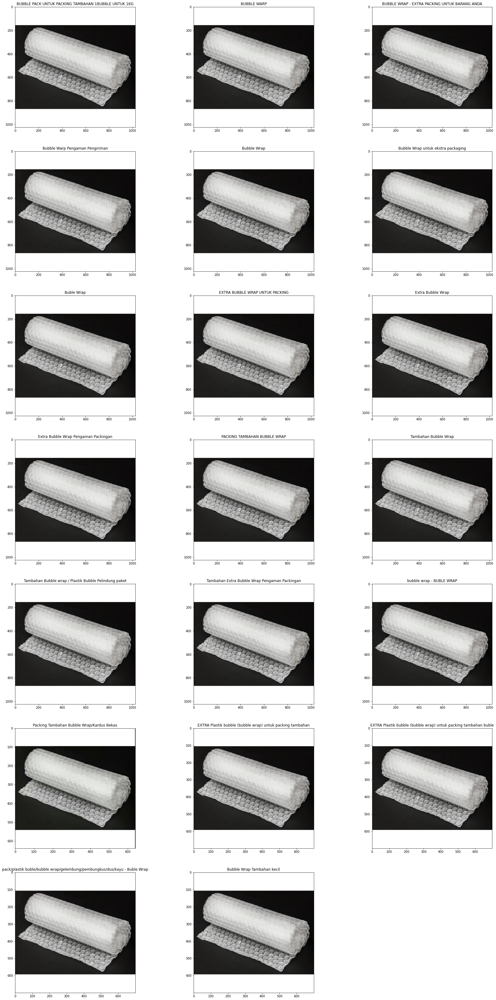

In [34]:
# Show copies of item train_3068759534 with image phash d0c0ea37bd9acce0
show_images(train, 'train_3068759534', image_phash=True)

In [35]:
# Check label groups of image phash d0c0ea37bd9acce0
train.loc[train['image_phash'] == 'd0c0ea37bd9acce0']['label_group'].value_counts()

4198148727    16
2403374241     3
1960893869     1
Name: label_group, dtype: int64

For image phash d0c0ea37bd9acce0, which is a generic image of bubble wrap, the label groups are different.

### Test Images

The dummy test set consists of 3 product images along with their data (excluding label groups).

The actual hidden test set on Kaggle will comprise 70,000+ products with the same format (test image directory and test.csv).

In [36]:
# The test .csv will not have the label_group column
test.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


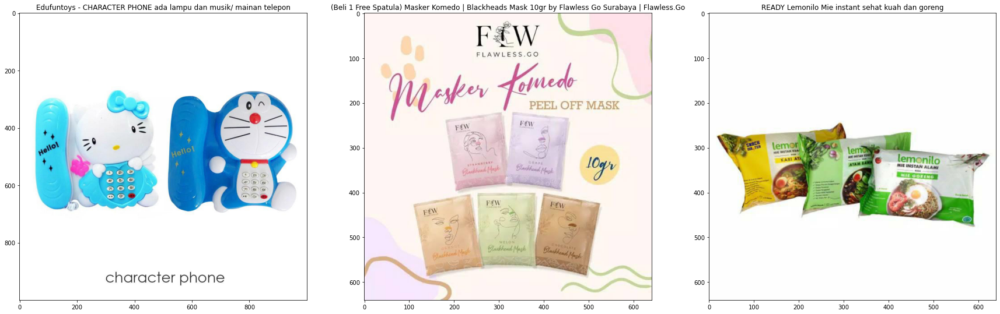

In [37]:
# Plot the dummy test images and titles
plt.figure(figsize=(30,10))
for i in range(test.shape[0]):
    plt.subplot(1, 3, i + 1)
    im = Image.open(test_dir + test['image'].iloc[i])
    plt.imshow(im)
    plt.title(test['title'].iloc[i])

### Observations on Image Data
**General**
- Image pixel sizes are different and will have to be resized for the image model
- Colour is an important feature and images should not be grayscaled

**Label Groups**
- Label group sizes have skewed distribution: 63% are size 2, 16% are size 3, 8% are size 4 etc
    - Most label groups are of size 2
    - It could be better to make fewer predictions in general
- The same label group can contain images of different phash
- Images of the same label group vary in these ways:
    - Image size
    - Image design
    - Overlaying of words/branding/sales information (in various languages)
    - Positioning/size of the product within the image
    - Background colour
    
**Image Phash**
- Image phash sizes have skewed distribution: 89% are size 1, 8% are size 2, 2% are size 3 etc
- Images of the same phash generally belong to the same label group, but not always
- Since most image phash are unique, it may not be that useful in our predictions
- Image phash could be used as a baseline for our image model
    - Predict which products are the same based on image duplicates

## Text Data (Titles)

### Distributions

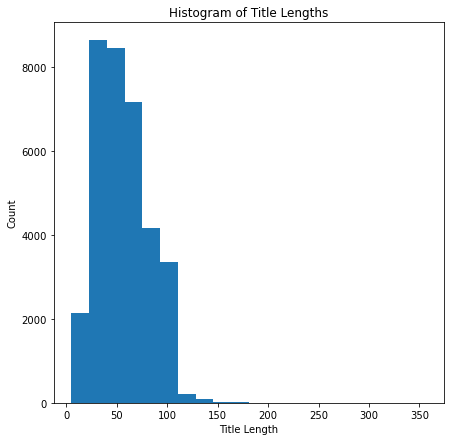

In [38]:
# Check distribution of title lengths
plt.figure(figsize=(7,7))
plt.hist([len(title) for title in train['title']], bins=20)
plt.xlabel('Title Length')
plt.ylabel('Count')
plt.title('Histogram of Title Lengths');

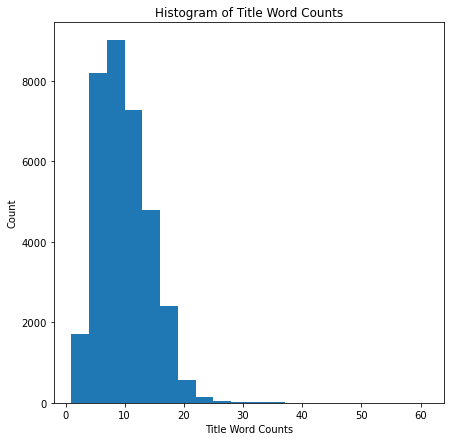

In [39]:
# Check distribution of title word counts
plt.figure(figsize=(7,7))
plt.hist([len(title.split(' ')) for title in train['title']], bins=20)
plt.xlabel('Title Word Counts')
plt.ylabel('Count')
plt.title('Histogram of Title Word Counts');

In [40]:
# Create corpus of all title data
title_corpus = train['title'].str.cat(sep=' ')
title_corpus = title_corpus.lower()

In [41]:
# All tokens in title corpus
tokens = title_corpus.split(' ')
len(tokens)

324165

In [42]:
# Check most common tokens in title
freq = nltk.FreqDist(tokens)
freq.most_common(50)

[('/', 8616),
 ('-', 5221),
 ('anak', 1916),
 ('wanita', 1820),
 ('', 1706),
 ('original', 1681),
 ('1', 1400),
 ('murah', 1363),
 ('tas', 1192),
 ('dan', 1157),
 ('pria', 1122),
 ('masker', 1111),
 ('untuk', 1068),
 ('|', 1066),
 ('bayi', 1061),
 ('&', 1042),
 ('ml', 1028),
 ('anti', 1018),
 ('set', 992),
 ('2', 931),
 ('baby', 887),
 ('3', 868),
 ('tangan', 862),
 ('air', 836),
 ('isi', 814),
 ('kaos', 811),
 ('motif', 807),
 ('sepatu', 796),
 ('warna', 792),
 ('baju', 791),
 ('cream', 787),
 ('mini', 786),
 ('premium', 780),
 ('import', 746),
 ('celana', 743),
 ('alat', 712),
 ('bahan', 699),
 ('gr', 674),
 ('polos', 669),
 ('rambut', 658),
 ('led', 598),
 ('+', 589),
 ('fashion', 584),
 ('serum', 568),
 ('mask', 566),
 ('jam', 552),
 ('pcs', 550),
 ('x', 548),
 ('in', 531),
 ('lampu', 522)]

As shown above, the most frequent tokens in the title corpus are generic words or non-alphanumeric characters. The titles will need to be pre-processed for the text model.

### Translating vs Tokenizing

In [43]:
# Check some titles
for title in train['title'].head(10):
    print(title)

Paper Bag Victoria Secret
Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DOUBLE FOAM TAPE
Maling TTS Canned Pork Luncheon Meat 397 gr
Daster Batik Lengan pendek - Motif Acak / Campur - Leher Kancing (DPT001-00) Batik karakter Alhadi
Nescafe \xc3\x89clair Latte 220ml
CELANA WANITA  (BB 45-84 KG)Harem wanita (bisa cod)
Jubah anak size 1-12 thn
KULOT PLISKET SALUR /CANDY PLISKET /WISH KULOT PREMIUM /KULOT PELANGI PREMIUM/HIEKA KULOT
[LOGU] Tempelan kulkas magnet angka, tempelan angka magnet
BIG SALE SEPATU PANTOFEL KULIT KEREN KERJA KANTOR LAKI PRIA COWOK DINAS RESMI FORMAL PESTA KICKERS


In [44]:
# Initialize Google translator
translator = google_translator()

In [45]:
# Tokenize with only characters
tokenizer = nltk.tokenize.RegexpTokenizer('[a-zA-Z]+')

#### Tokenize then translate

In [46]:
tokenizer.tokenize('Nescafe \xc3\x89clair Latte 220ml')

['Nescafe', 'clair', 'Latte', 'ml']

In [47]:
translator.translate(tokenizer.tokenize('Nescafe \xc3\x89clair Latte 220ml'))

"['Nescafe', 'clair', 'Latte', 'ml'] "

In [48]:
tokenizer.tokenize('CELANA WANITA  (BB 45-84 KG)Harem wanita (bisa cod)')

['CELANA', 'WANITA', 'BB', 'KG', 'Harem', 'wanita', 'bisa', 'cod']

In [49]:
translator.translate(tokenizer.tokenize('CELANA WANITA  (BB 45-84 KG)Harem wanita (bisa cod)'))

"['Pants', 'woman', 'bb', 'kg', 'harem', 'woman', 'can', 'cod'] "

#### Translate then tokenize

In [50]:
translator.translate('Nescafe \xc3\x89clair Latte 220ml')

'Nescafe Ã ‰ clair milk 220ml '

In [51]:
tokenizer.tokenize(translator.translate('Nescafe \xc3\x89clair Latte 220ml'))

['Nescafe', 'clair', 'milk', 'ml']

In [52]:
translator.translate('CELANA WANITA  (BB 45-84 KG)Harem wanita (bisa cod)')

"Women's Pants (BB 45-84 Kg) Harem Women (Can Cod) "

In [53]:
tokenizer.tokenize(translator.translate('CELANA WANITA  (BB 45-84 KG)Harem wanita (bisa cod)'))

['Women', 's', 'Pants', 'BB', 'Kg', 'Harem', 'Women', 'Can', 'Cod']

A translation library such as Google translator could be useful in converting all titles to English.

However, it may not be practical given the need to access Google's online translate API.

### Titles from Same Label Group

#### Label Groups with 51 products

Examine titles from the same label group for similarities and potential stop words

In [53]:
for title in train.loc[train['label_group'] == 1163569239]['title']:
    print(title)

SCARLETT SERUM - BEBAS PILIH
SCARLETT WHITENING ACNE SERUM
SERUM SCARLETT ACNE & BRIGHTLY- SERUM WAJAH SCARLETT ORIGINAL BPOM
Scarlett Whitening Brightly Ever After Serum
SCARLETT serum wajah NEW
SERUM SCARLETT ACNE & BRIGHTLY- FACE SERUM ORIGINAL BPOM
SCARLETT Whitening Brightly Ever After Serum / Whitening Acne Serum
SCARLETT WHITENING BRIGHTLY EVER AFTER SERUM
SCARLETT ACNE SERUM & BRIGHTLY EVER AFTER SERUM
Scarlett Serum
SERUM SCARLETT 15ML BRIGHTLY / ACNE PILIH SALAH SATU
SCARLETT ACNE SERUM / BRIGHTLY EVER AFTER SERUM
SCARLETT WHITENING SERUM
[READY] Scarlett Whitening Serum Acne/ Brightly Ever After by felicia
Scarlett Whitening Serum Brightly Ever After Serum / Acne Serum
Scarlett Brightly atau Acne Serum
SCARLETT Serum By Felicya Angelista |Acne Serum |Brightly Ever After Serum |Serum Wajah
Scarlett Whitening Serum BPOM - Serum ACNE SCARTLETT - Serum BRIGHTLY EVER AFTER SCARLETT
[RESELLER]SCARLETT WHITENING Brightly Ever After & Acne Serum BPOM 15mL
SCARLETT Brightly Ever Afte

In [54]:
for title in train.loc[train['label_group'] == 159351600]['title']:
    print(title)

Ready Stock - Gluta Collagen Soap By Beautetox / Sabun Viral Tiktok / Sabun gluta colagen
GLUTA COLLAGEN SOAP BY BEAUTETOX SKINSUPERSTAR
KIRIM SETIAP HARI!! GLUTA COLLAGEN SOAP BEAUTETOX CHOCOWHITE WHITEMILKY
[Ready & Resmi] Gluta Soap Beautetox Viral
READY STOK [THE3ANGLE-KD] Gluta Collagen Beautetox Chocowhite Whitemilky NEW PACKAGING - FREE GIFT**
[READY SIAP KIRIM] GLUTA COLLAGEN SOAP
(DISKON 11-11 BURUAN ORDER) Sabun Whitening Gluta Collagen Beautetox Chocowhite Whitemilky ORIGINAL
[FREE JARING SABUN] Gluta Collagen Soap [READY]
GLUTA COLLAGEN SOAP (ready) free jaring sabun
READY STOCK FREE GIFT GLUTA COLLAGEN SOAP BEAUTETOX
[READY] [OPEN RESELLER] [RESMI] Sabun Whitening Gluta Collagen beautetox soap
GCS WHITEMILKY CHOCOWHITE free JARING sabun READY
[ BPOM ] SABUN WHITENING GLUTA COLLAGEN SOAP BEAUTETOX CHOCOWHITE DAN WHITEMILKY
[ FREE GIFT - READY STOK SIAP KIRIM ] GLUTA COLLAGEN SOAP ( BEAUTETOX )
[MINIBOSS] GLUTA COLLAGEN SOAP BEAUTETOX
[READY FREE JARING]Gluta Collagen Soap b

In [55]:
for title in train.loc[train['label_group'] == 994676122]['title']:
    print(title)

KARET KUCIR PREMIUM
100Pcs Karet Ikat Rambut Elastis untuk Wanita
100 Pcs Ikat Rambut Karet Polos Elastis Gaya Korea untuk Wanita
100/1000 Pcs Ikat Rambut Korea Karet Polos Elastis Gaya Korea Untuk Wanita
Korea women children hair tie head rope karet gelang elastis
Ikat Rambut Karet Polos Elastis Gaya Korea untuk Wanita
50Pcs Ikat Rambut Korea Karet rambut Polos Elastis Gaya Korea Untuk Wanita kuncir tail rambut
1pcs Kunciran Rambut Karet / Kuncir Rambut Karet Warna Warni RANDOM COLOUR
[Ready Stock] Ikat Rambut Korea Simple Cute Murah
(COD) Karet Rambut Elastis 1SET Plus Pouch H144 Gaya Korean Fashion / Ikat Rambut Korea / Mallshop
100Pcs Karet Ikat Rambut Korea Warna Campur untuk Orangtua / Anak
Karet gelang ikat rambut korea simple dan murah
100pcs/Set Bts Korea hair ring high elastic simple hair rope headband creative Tali rambut
(27AN.ID)COD Ikat Karet Rambut H144 100pcs+pouch Warna Polos Gaya Korea / Ikat Rambut  Elastis
Karet Rambut Wanita Model Korea f224
\xe3\x80\x90COD\xe3\x80

In [56]:
for title in train.loc[train['label_group'] == 3113678103]['title']:
    print(title)

832P - FLEXIBLE Sambungan Kran FLEXIBLE irit air Keran Splash shower--168--
DMR Sambungan Kran FLEXIBLE irit air Keran Splash Shower 0515
[ACQ] Saringan Kran Air Flexible \xe2\x80\xa2360 [Kode A1]
Sambungan Kran Air fleksibel Filter air Anti Splash Shower wastafel kamar mandi toilet dapur
SAMBUNGAN KRAN AIR FLEXSIBLE PENYARING KERAN AIR FAUCET FILTER K40
Hub Keran Sambungan Keran Keranair Keran Cuci Piring Keran Angsa /Flexible /Kh106
Kings- H722 Sambungan Saringan Penghemat Air Fleksibel / Berputar 360 Derajat / Water Filter
GBI Sambungan Kran Air / Keran Hemat Air Berputar 360drajat Aerator Irit Air
Sambungan Keran Kran Air Faucet Plastic Shower Head Water Saving - Spiral dengan rotasi 360 derajat
FLEXIBLE Faucet Water Filter Purifier Head Saringan Kran Air
JOSERBA Sambungan kepala keran irit air 360 derajat
Sambungan Keran Kran Air Faucet Plastic Shower Head Water Saving-yoyosoo
Sambungan Tambahan Kran Air Filter Aerator Putar 360 BOX PACKING MIKA
ALAT PENGATUR KRAN AIR 360\xc2\xb0 

In [57]:
for title in train.loc[train['label_group'] == 3627744656]['title']:
    print(title)

IMPLORA CHEEK & LIPTINT - IMPLORA LIP TINT ORIGINAL BPOM
IMPLORA CHEEK & LIPTINT
Lip Tint Implora Cheek & Liptint
IMPLORA Cheek & Lip Tint Model Ice Cream - Set Liptint & Pemerah Pipi
{Promo murah} Implora cheek&liptint
Implora Cheek and Liptint/ Lip Tint implora
IMPLORA CHEEK LIP TINT
New cheek dan Liptint/ lip tint by IMPLORA bpom
Implora Cheek & Liptint - Implora Liptint - Lip Tint Implora
NEW LIPTINT IMPLORA / IMPLORA CHEEK & LIPTINT
IMPLORA BARU - IMPLORA CHEEKLIT & LIP TINT
IMPLORA Cheek And Liptint BPOM ORIGINAL ICE CREAM LIP TINT/ Lip Tint Pemerah Bibir
Implora Cheek & liptint
Implora Cheek & Liptint - Implora Liptint - Lip Tint Implora
IMPLORA CHEEK & LIP TINT 5.5GR
IMPLORA CHEEK & LIPTINT / EMINA LIPTINT ORIGINAL
IMPLORA Cheek and Liptint 5.5g Original Lip Tint | Lip Tin | Liptin
(BPOM) IMPLORA Cheek & Lip Tint | Liptint | Ice Cream 5.5gr
Implora lip tint cheek lip
Implora lip tint ice cheeck
IMPLORA LIP TINT - Implora cheek & lip tint
IMPLORA Cheek & Lip Tint 5.5g
IMPLORA CH

In [58]:
for title in train.loc[train['label_group'] == 1141798720]['title']:
    print(title)

ARSHOP MAYCREATE MOISTURIZING UV SPRAY 150ML (1 KG MUAT 6PCS)
\xe2\x9d\xa4 RATU \xe2\x9d\xa4 MAYCREATE MOISTURIZING SPRAY - LOTION SPRAY MAY CREATE 150ML ORIGINAL
MAYCREATE MOISTURIZING LOTION/WHITENING SUNSCREEN SPF 50
Jakarta Maycreate Moisturizing Spray Melembabkan Sunblock Whitening Spray Spf 150ml 100% ORI
MAYCREATE LOTION SPRAY 150ML - Maycreat isolation protection body cream maycreat lotion semprot
ISOLATION WHITENING PROTECTION SPRAY
MAYCREATE LOTION SPRAY 150ML - Maycreat isolation protection body cream maycreat lotion semprot
ORIGINAL 100% Maycreate Whitening Spray SPF50
MY CREATE SPRAY PEMUTIH VIRAL TIKTOK LOTION KOREA
MAYCREATE MOISTURIZING SPRAY 150ML / kimberlin
MAYCREATE MOISTURIZING SPRAY 150ML zoomstar
Maycreate
Maycreate isolation spray
[IMPORT] - Maycreate Isolation Protection Spray 150ml
b"M'AYCREATE MOUSTURIZING PROTECTION SPRAY /PEMUTIH KULIT"
MAYCREATE MOISTURIZING LOTION/WHITENING SUNSCREEN SPF 50 WATERPROOF
maycreate instant  ORIGINAL whitening spray / INSTANT 

#### Label Groups with 2 products

In [59]:
# Check smallest label groups
train.loc[train['matches'].map(len) == 2].head(10)

,posting_id,image,image_phash,title,label_group,matches,image_duplicates
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,"[train_129225211, train_2278313361]",[train_129225211]
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,"[train_3386243561, train_3423213080]",[train_3386243561]
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,"[train_2288590299, train_3803689425]",[train_2288590299]
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,"[train_2406599165, train_3342059966]",[train_2406599165]
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,"[train_3369186413, train_921438619]",[train_3369186413]
7,train_1806152124,0014f61389cbaa687a58e38a97b6383d.jpg,eea7e1c0c04da33d,KULOT PLISKET SALUR /CANDY PLISKET /WISH KULOT...,1565741687,"[train_1806152124, train_3227306976]",[train_1806152124]
9,train_831680791,001be52b2beec40ddc1d2d7fc7a68f08.jpg,e1ce953d1a70618f,BIG SALE SEPATU PANTOFEL KULIT KEREN KERJA KAN...,2630990665,"[train_831680791, train_3031035861]",[train_831680791]
13,train_998568945,001f4c8331d0554d133b10d85b7fafb2.jpg,d8a6082bb93d2db5,Lampu led t5 Speedometer Dashboard Motor Mobil...,4206465630,"[train_998568945, train_3118756415]",[train_998568945]
16,train_3009013664,0027aaf8dd8bdbf0e4f2c19024e436cf.jpg,b3cccc26cc3333cc,MARKS & SPENCER - Rose Hand & Body Lotion 250 ml,1574620312,"[train_3009013664, train_3448377589]",[train_3009013664]
17,train_3054371232,00286d2760e433a8a01cbd9e056144f7.jpg,be85837b8ca44ad3,"Saffron 0,25 gr s.d 2 gr Super Negin Premium Q...",2353399596,"[train_3054371232, train_2301578474]",[train_3054371232]


In [60]:
# Check pairs of titles in same product groups
for matches in train.loc[train['matches'].map(len) == 2].head(100)['matches']:
    print(train.loc[train['posting_id'] == matches[0]]['title'].values)
    print(train.loc[train['posting_id'] == matches[1]]['title'].values)
    print('')

['Paper Bag Victoria Secret']
['PAPER BAG VICTORIA SECRET']

['Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DOUBLE FOAM TAPE']
['Double Tape VHB 3M ORIGINAL 12mm x 4.5mm Busa Perekat']

['Maling TTS Canned Pork Luncheon Meat 397 gr']
['Maling Ham Pork Luncheon Meat TTS 397gr']

['Daster Batik Lengan pendek - Motif Acak / Campur - Leher Kancing (DPT001-00) Batik karakter Alhadi']
['DASTER PIYAMA KATUN JEPANG(TIDAK BISA PILIH MOTIF & WARNA)']

['Nescafe \\xc3\\x89clair Latte 220ml']
['Nescafe Eclair Latte Pet 220 Ml']

['KULOT PLISKET SALUR /CANDY PLISKET /WISH KULOT PREMIUM /KULOT PELANGI PREMIUM/HIEKA KULOT']
['KULOT PLISKET MOMBLU']

['BIG SALE SEPATU PANTOFEL KULIT KEREN KERJA KANTOR LAKI PRIA COWOK DINAS RESMI FORMAL PESTA KICKERS']
['BEST SELLER! Sepatu Pantofel Pria 100% Kulit Sapi Premium untuk Kantor Kerja Pesta 902HT']

['Lampu led t5 Speedometer Dashboard Motor Mobil 5050 Speedo Bright']
['Lampu LED T5 5050 1SMD LED Bulb DC12V Indicator Light Dashboard Speedometer Motor Mobil P

['Casing Motif Marmer Aksen Kaca Anti Jatuh Aneka Warna untuk Oppo A9 2020/A5 2020']

['SWEATER MURAH - IMAGINE HOODIE - SWEATER HOODIE - SWEATER KEKINIAN - GROSIR JAKET PRIA WANITA']
['SWEATER MURAH  - IMAGINE HOODIE - SWEATER HOODIE - SWEATER KEKINIAN - GROSIR JAKET PRIA WANITA']

['REPACK ORI CAT FOOD ORICAT FOOD 1KG MAKANAN KUCING ORI CAT']
['ORI CAT Repack 1kg']

['Bubel warp']
['\\xe2\\x9c\\x85COD Bubble Wrap Packing Tambahan Jam Tangan']

['PLAZA KOREA - KIMCHI SAWI FRESH 500GR - MAKANAN KOREA']
['Kimchi Sawi Fresh (HALAL) 500 gram']

['SARUNG TANGAN RAJUT TOUCHSCREEN POLOS WARNA']
['BUY 1 GET 1!! SARUNG TANGAN MOTOR TOUCH SCREEN / SARUNG TANGAN MOTOR SENTUH HP']

['TS101 - TAS GOYAVE TRANSPARAN PVC IMPORT MURAH HANDBAG FASHION JEPANG']
['TAS063 TAS GOYAVE TRANSPARAN TAS PVC IMPORT TAS MURAH HANDBAG NEW ARRIVAL FASHION JEPANG']

['KEMEJA ANAK LAKI-LAKI  Merk Gymboree/Bobo Kids/oshkosh size 1-7thn']
['Kaos anak laki-laki sz 2-10 thn merk GYMBORE/OSHKOSH \\xf0\\x9f\\x91\\x8d']

['

### Observations on Text Data

**Language**
- Most titles are in Indonesian
- In general, titles in the same product group are of the same language

**Stop words**
- Common stop words could be removed for better text matching (e.g. 'sale', 'promo', 'stock', 'original' etc)

**Key words**
- In general, titles in the same product group contain the same key words, which are unlikely to be in unrelated product titles
- TF-IDF could be useful in generating text embeddings

**Characters**
- Non-alphanumeric characters such as '\', '-', '|' are very common and should be removed from the text tokens
- UTF-8 characters such as '\\xe2\\x80\\x9cH-108\\xe2\\x80\\x9d' should be converted to alphabets